# Initialize

In [1]:
sc.addFile("s3://mist-production-jupyterhub-notebooks/jupyter/mayzarl@juniper.net/utils.py")
from utils import *

Starting Spark application


ID,YARN Application ID,Kind,State,Spark UI,Driver log,User,Current session?
311,application_1652123500543_0313,pyspark,idle,Link,Link,mayzarl,✔


FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

SparkSession available as 'spark'.


FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

In [2]:
%%local
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px

In [7]:
device_profile = '0af063df-784f-451d-8ce9-84d0ba3abb78'

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

In [4]:
df_device_name =spark.read.parquet("s3://mist-secorapp-production/dimension/device")
df_device_name.printSchema()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

Interrupted by user


In [3]:
# Ap Name
df_org= spark.read.parquet("s3://mist-secorapp-production/dimension/org").select(F.col("id").alias("org_id"),F.col("name").alias("org_name")).persist()
df_name= spark.read.parquet("s3://mist-secorapp-production/dimension/site/site.parquet").select(F.col("id").alias("site_id"),F.col("name").alias("site_name"),F.col("org_id").alias("org_id")).join(df_org,["org_id"])\
                .select("org_name","site_name","org_id","site_id").persist()
df_device_name =spark.read.parquet("s3://mist-secorapp-production/dimension/device")\
                .select(F.col("mac").alias("ap_id"),F.col("name").alias("ap_name"),"site_id","model","type").persist()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

In [8]:
df_device_name.filter(F.col("site_id")=="8cb91905-1843-4574-b7de-d2d0ae353cab").show()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+------------+------------------+--------------------+----------+------+
|       ap_id|           ap_name|             site_id|     model|  type|
+------------+------------------+--------------------+----------+------+
|a8537d00e934|    MIST-1C30-AP62|8cb91905-1843-457...|      AP43|    ap|
|a8537d013d3a|   MIST-2MG33-AP42|8cb91905-1843-457...|      AP43|    ap|
|a8537d013a74|   MIST-2MG33-AP53|8cb91905-1843-457...|      AP43|    ap|
|a8537d00e9f7|   MIST-2MG33-AP55|8cb91905-1843-457...|      AP43|    ap|
|a8537d013d26|    MIST-1C30-AP47|8cb91905-1843-457...|      AP43|    ap|
|840328853360|aus07-smi-lab-core|8cb91905-1843-457...|EX4300-48P|switch|
|a8537d00e907|                  |8cb91905-1843-457...|      AP43|    ap|
|a8537d00e97f|                  |8cb91905-1843-457...|      AP43|    ap|
|a8537d00e9ed|                  |8cb91905-1843-457...|      AP43|    ap|
|a8537d00e9b1|                  |8cb91905-1843-457...|      AP43|    ap|
|a8537d00e8a3|                  |8cb91905-1843-457.

In [9]:
df_device_name.filter(F.col("ap_id").isin("a8537d00e812","a8537d012f20","a8537d012f20","a8537d012f52")).show()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+------------+--------------+--------------------+-----+----+
|       ap_id|       ap_name|             site_id|model|type|
+------------+--------------+--------------------+-----+----+
|a8537d00e812|MIST-2G34-AP17|8cb91905-1843-457...| AP43|  ap|
|a8537d012f52|MIST-2F42-AP02|8cb91905-1843-457...| AP43|  ap|
|a8537d012f20|MIST-2F42-AP01|8cb91905-1843-457...| AP43|  ap|
+------------+--------------+--------------------+-----+----+

# Get Data

In [7]:
site_id ="8cb91905-1843-4574-b7de-d2d0ae353cab"
for d in range(1,3):
    current_date = datetime.now() - timedelta(days=d)
    date = "{}".format(current_date.date())
    for h in range(24):
        hr = str(h).zfill(2)
#         df = spark.read.orc("s3://mist-secorapp-production/cv-ap-scans-multipartition/cv-ap-scans-multipartition-production/dt={}/hr={}".format(date,hr))\
#                                .filter(F.col("site")==site_id).persist()
#         df.coalesce(5).write.mode("overwrite").parquet("s3://mist-data-science-dev/may/rrm/tesla_scan/date={}/".format(date))

        df_scan = spark.read.parquet("s3://mist-secorapp-production/ap-stats-full/ap-stats-full-production/dt={}/hr={}".format(date,hr))\
                            .filter((bytes_to_uuid("site_id")==site_id)).persist()
        df_scan.coalesce(16).write.mode("overwrite").parquet("s3://mist-data-science-dev/may/rrm/tesla_scan_utilization_ap_stats/date={}/hr={}".format(date,hr))
        df_scan.unpersist()


FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

Interrupted by user


In [40]:
df_scan.unpersist()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

DataFrame[id: binary, scan24GHz: array<struct<ssid:binary,bssid:binary,rssi:int,channel:struct<primary:int,secondary:int,width:int>,potential_rogue:boolean,is_spoof:boolean,listen_channel:int>>, scan5GHz: array<struct<ssid:binary,bssid:binary,rssi:int,channel:struct<primary:int,secondary:int,width:int>,potential_rogue:boolean,is_spoof:boolean,listen_channel:int>>, scan_channel_stats: array<struct<channel:struct<primary:int,secondary:int,width:int>,noise_floor:int,congest:struct<rx_in_bss:float,rx_other_bss:float,non_wifi:float>,utilization:struct<all:float,tx:float,rx_in_bss:float,rx_other_bss:float,unknown_wifi:float,non_wifi:float>,when:struct<seconds:bigint,nanos:int>,band:int>>, uptime: int, report_all: boolean, channel_stats_version: int, scan6_ghz: array<struct<ssid:binary,bssid:binary,rssi:int,channel:struct<primary:int,secondary:int,width:int>,potential_rogue:boolean,is_spoof:boolean,listen_channel:int>>, copied: struct<id:binary,org_id:binary,site_id:binary,map_id:binary,xyz:a

In [6]:
df_scan = spark.read.parquet("s3://mist-data-science-dev/may/rrm/tesla_scan_utilization/")
df_scan.show()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+-------------------+--------------------+--------------------+--------------------+------+----------+---------------------+---------+--------------------+--------------------+----------+---+
|                 id|           scan24GHz|            scan5GHz|  scan_channel_stats|uptime|report_all|channel_stats_version|scan6_ghz|              copied|info_from_terminator|      date| hr|
+-------------------+--------------------+--------------------+--------------------+------+----------+---------------------+---------+--------------------+--------------------+----------+---+
|[A8 53 7D 00 E9 E3]|                  []|[{tesla-secure, �...|                  []|404666|      true|                   14|       []|{�S} ��, �]�9��J�...|{�]�9��J��3����,...|2022-06-06| 19|
|[A8 53 7D 00 E9 E3]|                  []|[{GFTX-GA1-TR-AP,...|                  []|404726|     false|                   14|       []|{�S} ��, �]�9��J�...|{�]�9��J��3����,...|2022-06-06| 19|
|[A8 53 7D 00 E9 E3]|                  [

In [ ]:
## ap_scan hourly statistic 
## capacity anomaly 
## utilization is good to have 
# number of connection 
# interference util rx_in_other_bss, non wifi and wifi. 

# Scan Data

In [6]:
date = "2022-06-08"
site_id ="8cb91905-1843-4574-b7de-d2d0ae353cab"

df = spark.read.orc("s3://mist-secorapp-production/cv-ap-scans-multipartition/cv-ap-scans-multipartition-production/dt={}/".format(date))\
                        .filter(F.col("site")==site_id).persist()
df.printSchema()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

root
 |-- ap: string (nullable = true)
 |-- ap2: string (nullable = true)
 |-- band: short (nullable = true)
 |-- channel: short (nullable = true)
 |-- in_site: boolean (nullable = true)
 |-- org: string (nullable = true)
 |-- rssi: float (nullable = true)
 |-- site: string (nullable = true)
 |-- time: timestamp (nullable = true)
 |-- radio_channel: short (nullable = true)
 |-- hr: integer (nullable = true)

In [8]:
df_avg_rssi = df.filter(F.col("in_site")==True).groupby("site","band","radio_channel","ap","ap2").agg(F.mean("rssi").alias("avg_rssi"))
df_avg_rssi.count()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

6107

In [9]:
%%spark -o df_avg_rssi -n 6107

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

In [15]:
%%local
df_avg_rssi[df_avg_rssi["ap"]=="a8537d013c7c"].head()

Output()

In [ ]:
%%local
a = df_avg_rssi[(df_avg_rssi["ap"].isin(aps)) & (df_avg_rssi["ap2"].isin(aps))]["avg_rssi"]
a.me

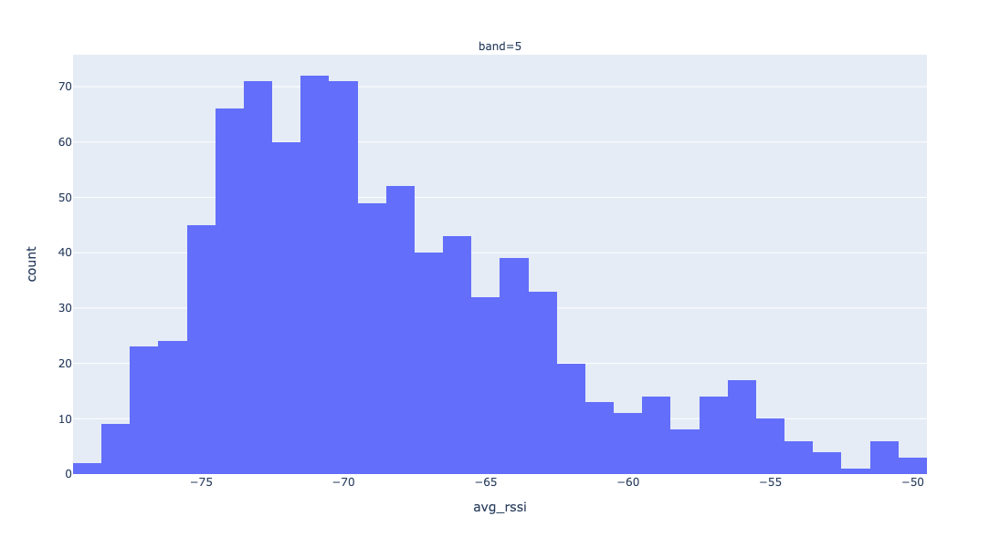

In [23]:
%%local
aps = ['a8537d013c7c', 'a8537d00e8f3', 'a8537d00e9e3', 'a8537d013c4a', 'a8537d013d21', 'a8537d013d71', 'a8537d013c6d',
             'a8537d013d0d', 'a8537d00e916', 'a8537d013cd1', 'a8537d0135bf', 'a8537d013d5d', 'a8537d00e51a', 'a8537d013ca4', 'a8537d00ea2e', 'a8537d013ce0', 'a8537d013d30', 
            'a8537d00e998', 'a8537d00e78b', 'a8537d013d35', 'a8537d013c81', 'a8537d00ea92', 'a8537d013a74', 'a8537d00e9f7']
fig = px.histogram(df_avg_rssi[(df_avg_rssi["ap"].isin(aps)) & (df_avg_rssi["ap2"].isin(aps))],x="avg_rssi",facet_col="band")
fig.update_layout(height=600, width=800)
fig.show()

## Aggregated

In [119]:
df_ap_scan.unpersist()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

DataFrame[ap: string, ap2: string, band: smallint, channel: smallint, in_site: boolean, org: string, rssi: float, site: string, time: timestamp, radio_channel: smallint, hr: int]

In [120]:
df_ap_scan = spark.read.parquet("s3://mist-data-science-dev/may/rrm/tesla_scan/date=2022-05-29").persist()
df_ap_scan.show(3)

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+------------+------------+----+-------+-------+--------------------+-----+--------------------+-------------------+-------------+---+
|          ap|         ap2|band|channel|in_site|                 org| rssi|                site|               time|radio_channel| hr|
+------------+------------+----+-------+-------+--------------------+-----+--------------------+-------------------+-------------+---+
|a8537d00e78b|            |  24|      6|  false|cd5d9339-d5dc-4a8...|-74.0|8cb91905-1843-457...|2022-05-29 19:32:39|            0| 19|
|a8537d00e78b|a8537d012d7c|  24|      6|   true|cd5d9339-d5dc-4a8...|-78.0|8cb91905-1843-457...|2022-05-29 19:32:39|            0| 19|
|a8537d0134f7|            |   5|     48|  false|cd5d9339-d5dc-4a8...|-85.0|8cb91905-1843-457...|2022-05-29 19:32:46|           52| 19|
+------------+------------+----+-------+-------+--------------------+-----+--------------------+-------------------+-------------+---+
only showing top 3 rows

In [5]:
df_ap_scan.filter(F.col("radio_channel")==F.col("channel")).show()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+------------+------------+----+-------+-------+--------------------+-----+--------------------+-------------------+-------------+---+
|          ap|         ap2|band|channel|in_site|                 org| rssi|                site|               time|radio_channel| hr|
+------------+------------+----+-------+-------+--------------------+-----+--------------------+-------------------+-------------+---+
|a8537d013d0d|a8537d013c63|  24|      6|   true|cd5d9339-d5dc-4a8...|-48.0|8cb91905-1843-457...|2022-05-29 17:02:34|            6| 17|
|a8537d013d0d|a8537d00e8d0|  24|      6|   true|cd5d9339-d5dc-4a8...|-57.0|8cb91905-1843-457...|2022-05-29 17:02:34|            6| 17|
|a8537d013d0d|a8537d00ea01|  24|      6|   true|cd5d9339-d5dc-4a8...|-62.0|8cb91905-1843-457...|2022-05-29 17:02:34|            6| 17|
|a8537d013d0d|a8537d00e984|  24|      6|   true|cd5d9339-d5dc-4a8...|-60.0|8cb91905-1843-457...|2022-05-29 17:02:34|            6| 17|
|a8537d013d0d|a8537d013c5e|  24|      6|   true|cd5d933

In [121]:
df_scan_rssi = df_ap_scan.filter(F.col("radio_channel")==F.col("channel"))\
                    .groupby("ap","ap2","band","in_site","radio_channel","channel","hr").agg(F.round(F.mean("rssi")).alias("avg_scan_rssi"),F.count("time").alias("scan_count"))
df_scan_rssi.count()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

5835

In [7]:
df_ap_scan.agg(F.countDistinct("ap2")).show()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+----------+
|count(ap2)|
+----------+
|        66|
+----------+

In [8]:
df_ap_scan.agg(F.countDistinct("ap")).show()

# in total there will be 69 APs

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+---------+
|count(ap)|
+---------+
|       65|
+---------+

In [122]:
%%spark -o df_scan_rssi -n 5835

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

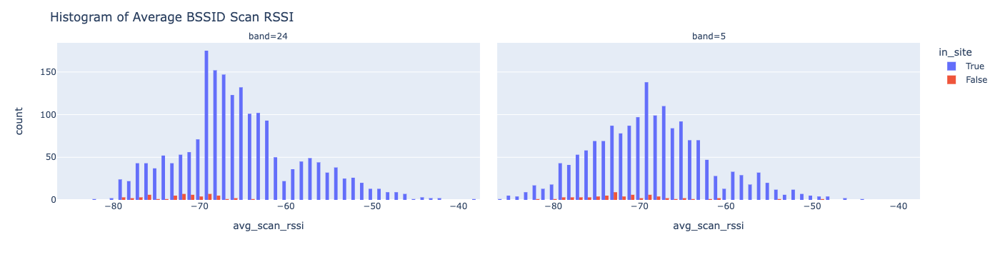

In [10]:
%%local
fig = px.histogram(df_scan_rssi,x="avg_scan_rssi",color="in_site",facet_col="band",barmode="group")
fig.update_layout(title = "Histogram of Average BSSID Scan RSSI")
fig.show()

In [217]:
%%local
temp

ap
a8537d00e51a     5
a8537d00e709    15
a8537d00e78b     7
a8537d00e7e0     6
a8537d00e812    14
                ..
a8537d013d26    11
a8537d013d35     7
a8537d013d3a     9
a8537d013d5d     5
a8537d013d71     8
Name: ap2, Length: 63, dtype: int64

In [236]:
%%local
temp = df_scan_rssi[df_scan_rssi["avg_scan_rssi"]>-65].groupby(["ap","band"])['ap2'].count().reset_index()
temp[temp["ap2"]<=4]

Output()

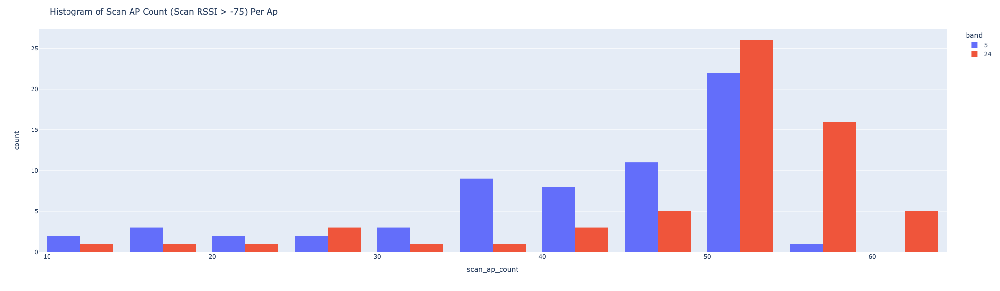

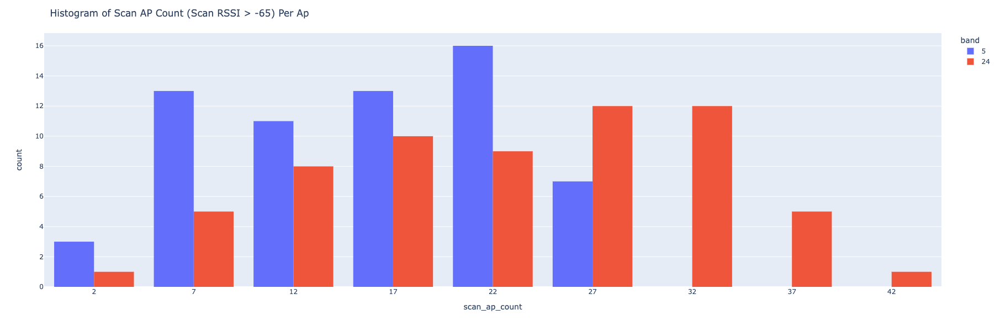

In [227]:
%%local
temp = df_scan_rssi[df_scan_rssi["avg_scan_rssi"]>-75].groupby(["ap","band"])['ap2'].count().reset_index()
fig = px.histogram(temp,x='ap2',color="band",barmode="group")
fig.update_layout(title = "Histogram of Scan AP Count (Scan RSSI > -75) Per Ap",xaxis_title = "scan_ap_count")
fig.update_layout(height=600, width=800)
fig.show()


temp = df_scan_rssi[df_scan_rssi["avg_scan_rssi"]>-65].groupby(["ap","band"])['ap2'].count().reset_index()
fig = px.histogram(temp,x='ap2',color="band",barmode="group")
fig.update_layout(title = "Histogram of Scan AP Count (Scan RSSI > -65) Per Ap",xaxis_title = "scan_ap_count")
fig.update_layout(height=600, width=800)
fig.show()

In [11]:
%%local
df_scan_rssi.head()

Output()

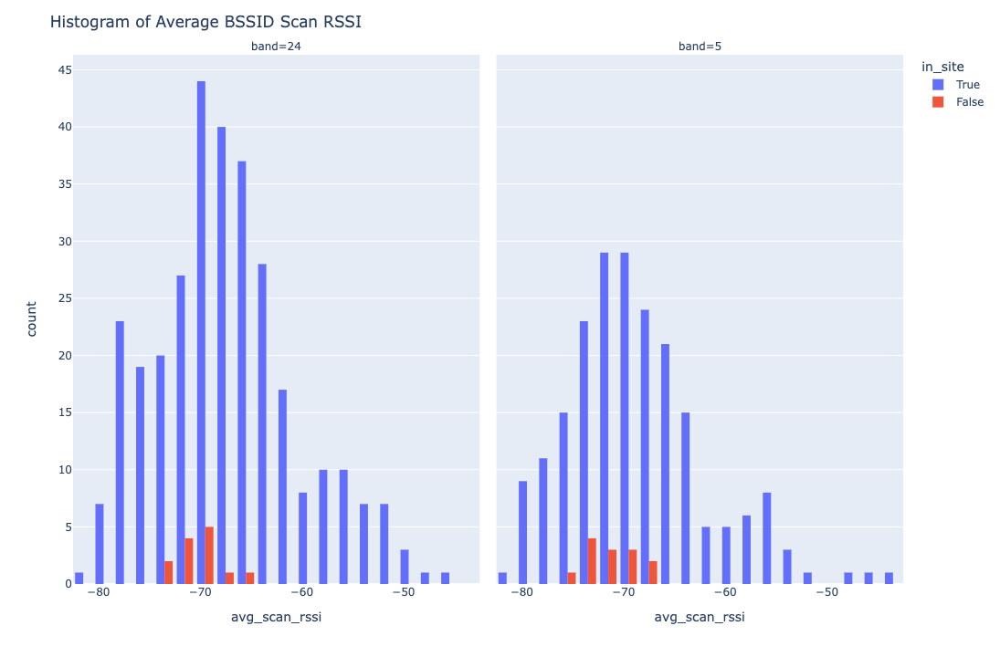

In [17]:
%%local
aps = ['a8537d00ea01', 'a8537d0134f7', 'a8537d012f52', 'a8537d00e812', 'a8537d012f20',\
'a8537d00e9e3', 'a8537d00ea9c', 'a8537d01311e', 'a8537d013a74', 'a8537d00eaa1', 'a8537d00eaab', 'a8537d0135ce', 'a8537d013d3a']
temp = df_scan_rssi[df_scan_rssi["ap"].isin(aps)]
fig = px.histogram(temp,x="avg_scan_rssi",color="in_site",facet_col="band",barmode="group")
fig.update_layout(title = "Histogram of Average BSSID Scan RSSI")
fig.show()

In [70]:
aps = ['a8537d00ea01', 'a8537d0134f7', 'a8537d012f52', 'a8537d00e812', 'a8537d013c59', 'a8537d00e9e3', 'a8537d012f20', \
'a8537d00ea9c', 'a8537d01311e', 'a8537d013a74', 'a8537d00eaa1', 'a8537d00eaab', 'a8537d0135ce', 'a8537d013d3a']
df_scan_filter = df_ap_scan.filter(F.col("ap").isin(aps)).filter(F.col("time")>"2022-05-28 20:00:00+00:00")
df_scan_filter.count()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

13092

In [71]:
%%spark -o df_scan_filter -n 13092

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

In [76]:
%%local
df_scan_filter.sort_values(by="time").head()

Output()

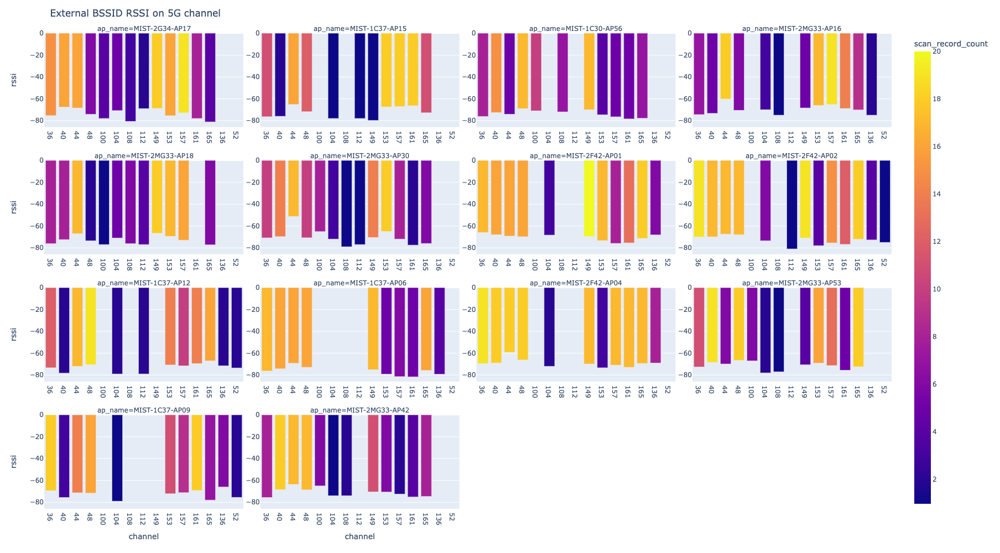

In [73]:
%%local

ap_name = {'a8537d00ea01': 'MIST-1C30-AP56',
 'a8537d0134f7': 'MIST-1C37-AP06',
 'a8537d012f52': 'MIST-2F42-AP02',
 'a8537d00e812': 'MIST-2G34-AP17',
 'a8537d013c59': 'MIST-1C37-AP09',
 'a8537d00e9e3': 'MIST-1C37-AP15',
 'a8537d012f20': 'MIST-2F42-AP01',
 'a8537d00ea9c': 'MIST-2MG33-AP16',
 'a8537d01311e': 'MIST-1C37-AP12',
 'a8537d013a74': 'MIST-2MG33-AP53',
 'a8537d00eaa1': 'MIST-2MG33-AP18',
 'a8537d00eaab': 'MIST-2MG33-AP30',
 'a8537d0135ce': 'MIST-2F42-AP04',
 'a8537d013d3a': 'MIST-2MG33-AP42'}

temp = df_scan_filter[(df_scan_filter["in_site"]==False) &(df_scan_filter["band"]==5)].groupby(["ap","band","channel"]).agg({"rssi": 'mean',"time" : 'nunique'}).reset_index()
temp["ap_name"] = temp["ap"].apply(lambda x: ap_name.get(x))
temp["channel"] = temp["channel"].apply(str)
temp["scan_record_count"] = temp["time"]
#temp["ap_name_channel"] = temp[["ap_name","channel"]].apply(lambda x: str(x[0])+" ch " + str(x[1]),axis=1)
fig = px.bar(temp,y="rssi",x="channel",barmode="group",facet_col="ap_name",facet_col_wrap=4,color="scan_record_count")
fig.update_layout(title = "External BSSID RSSI on 5G channel ")
fig.update_layout(height=1000, width=1800)
fig.update_yaxes(showticklabels=True)
fig.update_xaxes(showticklabels=True)
#(temp,x="channel",y="data_radio_noise_floor",color="ap_id",barmode="group")
fig.show()

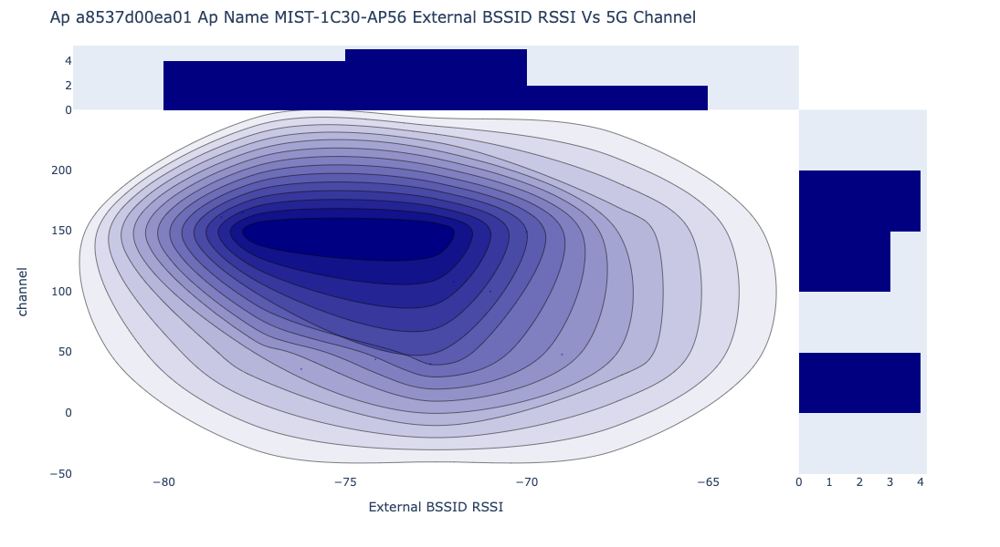

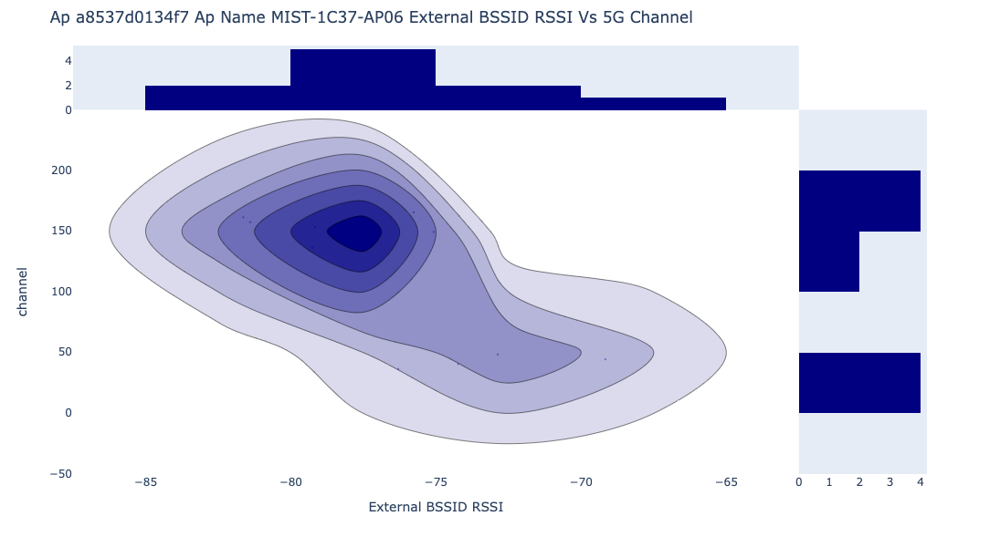

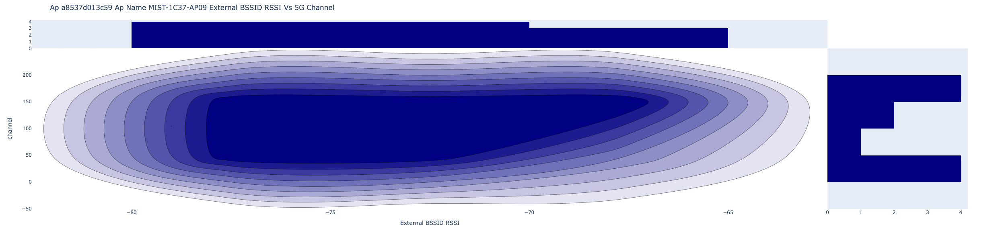

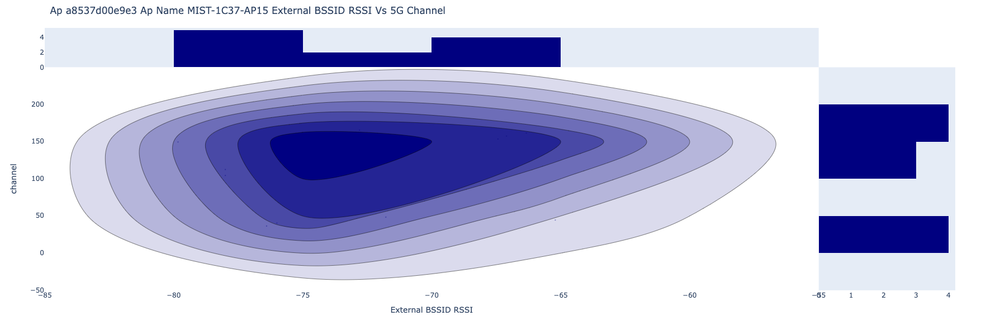

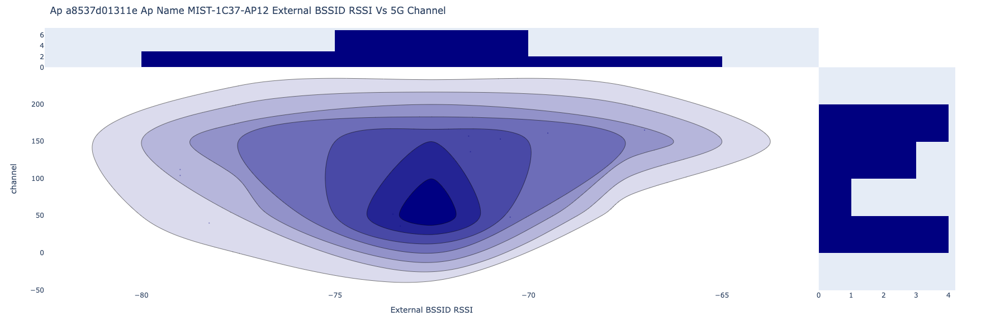

In [87]:
%%local
import plotly as py
import plotly.figure_factory as ff

temp = df_scan_filter[(df_scan_filter["in_site"]==False) &(df_scan_filter["band"]==5)].groupby(["ap","band","channel"]).agg({"rssi": 'mean',"time" : 'nunique'}).reset_index()
temp["ap_name"] = temp["ap"].apply(lambda x: ap_name.get(x))
#temp["channel"] = temp["channel"].apply(str)
temp["scan_record_count"] = temp["time"]

import numpy as np
for ap in ap_name.keys():
    if "C3" in ap_name[ap]:
        x = temp[temp["ap"]==ap]["rssi"]
        y = temp[temp["ap"]==ap]["channel"]

        ## Density Plot
        fig = ff.create_2d_density( x, y)
        fig.update_layout(height=600, width=800)
        fig.update_layout(
            title = "Ap {} Ap Name {} External BSSID RSSI Vs 5G Channel".format(ap,ap_name[ap]),
            xaxis_title="External BSSID RSSI ",
            yaxis_title="channel"
        )
        #fig.update_xaxes(range=(-100, -60))
        
        fig.show()

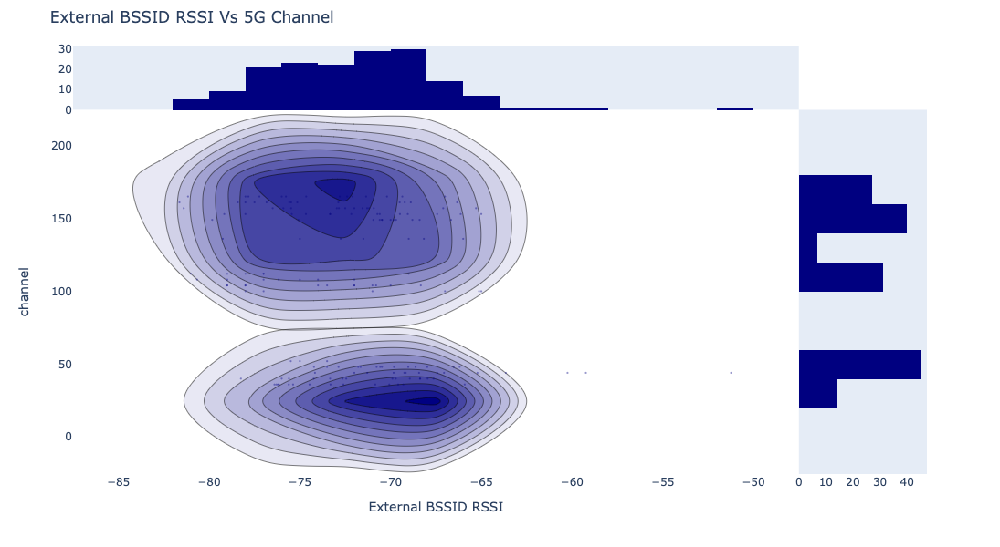

In [184]:
%%local
import plotly as py
import plotly.figure_factory as ff

temp = df_scan_filter[(df_scan_filter["in_site"]==False) &(df_scan_filter["band"]==5)].groupby(["ap","band","channel"]).agg({"rssi": 'mean',"time" : 'nunique'}).reset_index()
temp["ap_name"] = temp["ap"].apply(lambda x: ap_name.get(x))
#temp["channel"] = temp["channel"].apply(str)
temp["scan_record_count"] = temp["time"]

import numpy as np
x = temp["rssi"]
y = temp["channel"]

        ## Density Plot
fig = ff.create_2d_density( x, y)
fig.update_layout(height=600, width=800)
fig.update_layout(
            title = "External BSSID RSSI Vs 5G Channel".format(ap,ap_name[ap]),
            xaxis_title="External BSSID RSSI ",
            yaxis_title="channel"
        )
        #fig.update_xaxes(range=(-100, -60))
        
fig.show()

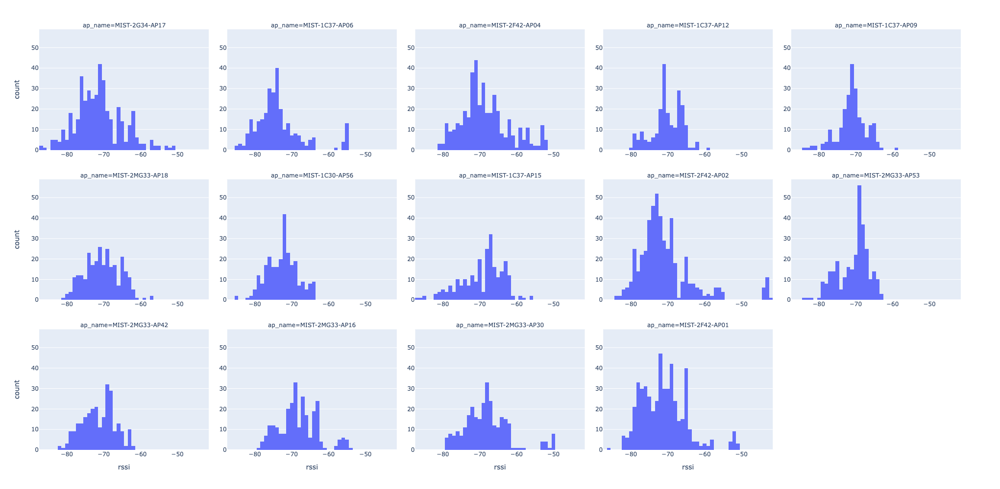

In [135]:
%%local
df_scan_filter.head()
df_scan_filter["ap_name"] = df_scan_filter["ap"].apply(lambda x: ap_name.get(x))

fig = px.histogram(df_scan_filter[(df_scan_filter["in_site"]==False)],x="rssi",facet_col="ap_name",facet_col_wrap=5)
fig.update_layout(height=1000, width=1800)
fig.update_yaxes(showticklabels=True)
fig.update_xaxes(showticklabels=True)

fig.show()

In [ ]:
%%local
temp = df_scan_rssi[df_scan_rssi["avg_scan_rssi"]>-75].groupby(["ap","band"])['ap2'].count().reset_index()
fig = px.histogram(temp,x='ap2',color="band",barmode="group")
fig.update_layout(title = "Histogram of Scan AP Count (Scan RSSI > -75) Per Ap",xaxis_title = "scan_ap_count")
fig.update_layout(height=600, width=800)
fig.show()


temp = df_scan_rssi[df_scan_rssi["avg_scan_rssi"]>-65].groupby(["ap","band"])['ap2'].count().reset_index()
fig = px.histogram(temp,x='ap2',color="band",barmode="group")
fig.update_layout(title = "Histogram of Scan AP Count (Scan RSSI > -65) Per Ap",xaxis_title = "scan_ap_count")
fig.update_layout(height=600, width=800)


## AP Cochannel

In [95]:
%%local
# ap co channel
temp[temp["band"]==5]["ap2"].mean()

4.980392156862745

In [96]:
%%local
# ap co channel
temp[temp["band"]==24]["ap2"].mean()

17.977777777777778

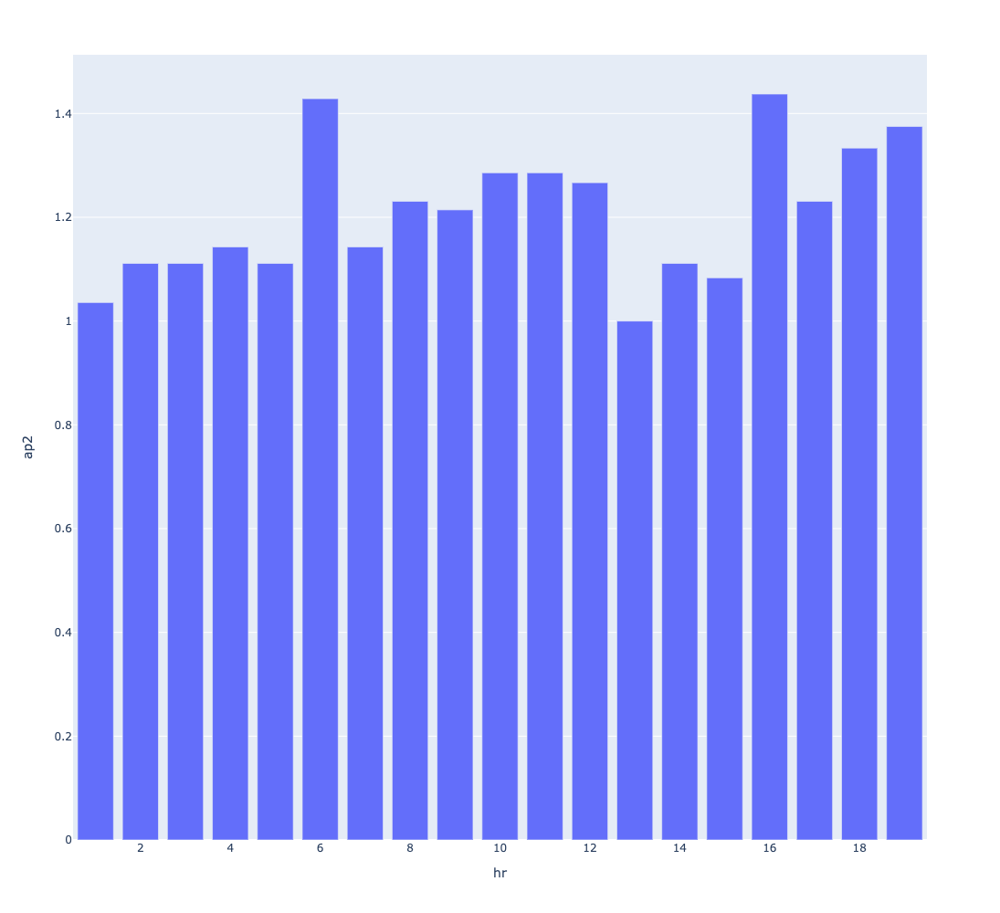

In [129]:
%%local
temp = df_scan_rssi[(df_scan_rssi["in_site"]==True) & (df_scan_rssi["avg_scan_rssi"]>-75)].groupby(["ap","band","radio_channel","channel","hr"])["ap2"].count().reset_index().sort_values(by="radio_channel")
temp.head()
fig = px.bar(temp[temp["band"]==5].groupby(["hr","band"])["ap2"].mean().reset_index(),y="ap2",x="hr",facet_col_wrap=5)
fig.update_layout(height=1000, width=1500,xaxis_title="hr")
fig.show()

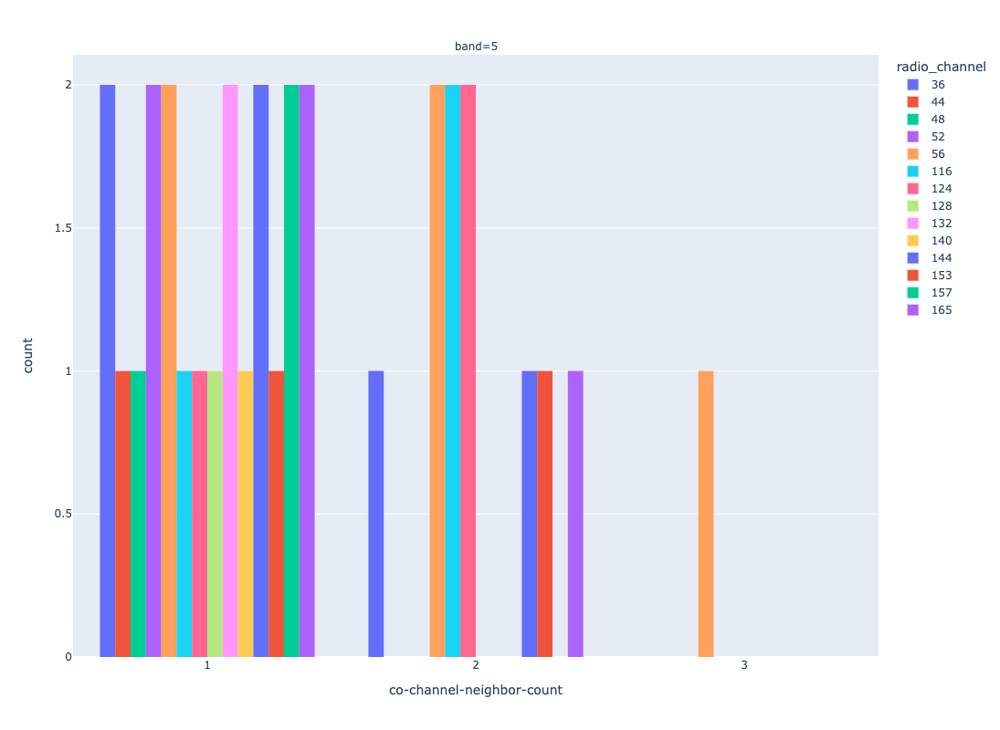

In [127]:
%%local
temp = df_scan_rssi[(df_scan_rssi["in_site"]==True) & (df_scan_rssi["avg_scan_rssi"]>-75) & (df_scan_rssi["hr"]==19)].groupby(["ap","band","radio_channel","channel"])["ap2"].count().reset_index().sort_values(by="radio_channel")
temp.head()
fig = px.histogram(temp[temp["band"]==5],x="ap2",facet_col="band",color="radio_channel",barmode="group")
fig.update_layout(height=800, width=800,xaxis_title="co-channel-neighbor-count")
fig.show()

# Utilization Scan

In [46]:
date = "2022-05-29"
hr="00"
df_ap_stats = spark.read.parquet("s3://mist-secorapp-production/ap-stats-full/ap-stats-full-production/dt={}/hr={}/".format(date,hr))
df_ap_stats.select(bytes_to_uuid("site_id")).show()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+------------------------------+
|convert_bytes_to_uuid(site_id)|
+------------------------------+
|          1d59a871-de04-497...|
|          a973291f-5592-48a...|
|          56c43a95-2f9a-477...|
|          8f805285-4325-4d9...|
|          4e091873-879d-49c...|
|          7c82d0d4-7f6c-4a1...|
|          5a031aca-77ca-4ad...|
|          5a9a24f4-075e-4e9...|
|          3b4eeab5-5d0e-404...|
|          e607409d-7139-4d1...|
|          ec98bf56-4d0a-439...|
|          7d9d53db-9ebf-4be...|
|          b8437a9d-bae6-4bd...|
|          273beb2e-677b-4e9...|
|          f89f614d-9bc9-4cd...|
|          4ce3ca9b-7ee1-4c8...|
|          a4bc599d-4467-4f6...|
|          ee4ff847-6bcb-4a9...|
|          9b0b82e8-8187-47c...|
|          931eff12-631a-458...|
+------------------------------+
only showing top 20 rows

In [108]:
df_scan.unpersist()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

DataFrame[id: binary, org_id: binary, groups: array<string>, site_id: binary, when: struct<seconds:bigint,nanos:int>, map_id: binary, xyz: array<double>, uptime: int, model: string, firmware_version: string, configured: boolean, license_expired: boolean, interval: double, proc: struct<mem_info:struct<total_kb:bigint,available_kb:bigint>,slab_info:struct<top:struct<name:string,active_objs:int,num_objs:int,obj_size:int>>,load_avg:struct<load:array<float>,running:int,total:int>,fs:struct<rw:struct<total_kb:bigint,available_kb:bigint>>,stat:struct<total_cpu:struct<name:string,user:bigint,nice:bigint,system:bigint,idle:bigint,iowait:bigint,irq:bigint,soft_irq:bigint,steal:bigint,guest:bigint,guest_nice:bigint>,cpus:array<struct<name:string,user:bigint,nice:bigint,system:bigint,idle:bigint,iowait:bigint,irq:bigint,soft_irq:bigint,steal:bigint,guest:bigint,guest_nice:bigint>>>>, switchports: array<struct<name:string,link:boolean,full_duplex:boolean,mbps:int,rx_bytes:bigint,rx_pkts:int,tx_byte

In [4]:
df_scan = spark.read.parquet("s3://mist-data-science-dev/may/rrm/tesla_scan_utilization_ap_stats/date=2022-06-*/*.parquet")\
                                .persist()
df_scan.show(3)

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+-------------------+--------------------+------+--------------------+--------------------+--------------------+--------------------+------+-------+--------------------+----------+---------------+------------+--------------------+--------------------+--------------------+--------------------+--------------------+---------------+--------------------+--------------------+--------------------+----+---------+--------+--------+-----------+-----------+--------------------+----+------------+--------------------+--------------------+--------------------+--------------------+---------------+-----+--------------------+
|                 id|              org_id|groups|             site_id|                when|              map_id|                 xyz|uptime|  model|    firmware_version|configured|license_expired|    interval|                proc|         switchports|                svis|         l2tptunnels|         dhcpclients|    ipv4_routes|              radios|               wlans|           

In [12]:
df_scan_radio = df_scan.select(bytes_to_mac("id").alias("ap_id"),F.explode("scan_channel_stats").alias("scan_channel_stats"),\
                                F.to_timestamp("info_from_terminator.timestamp.seconds").alias("when"))\
                        .select("ap_id",band_from_index("scan_channel_stats.band").alias("band"),F.col("scan_channel_stats.channel.primary").alias("channel"),F.col("scan_channel_stats.noise_floor").alias("scan_radio_noise_floor"),
                                F.col("scan_channel_stats.utilization.all").alias("scan_radio_util_all"),\
                                F.col("scan_channel_stats.utilization.rx_other_bss").alias("scan_radio_util_rx_other_bss"),\
                                (F.col("scan_channel_stats.utilization.non_wifi")+F.col("scan_channel_stats.utilization.unknown_wifi")).alias("scan_radio_util_non_wifi"),\
                                F.col("scan_channel_stats.congest.rx_other_bss").alias("scan_radio_congest_rx_other_bss"),\
                                F.col("scan_channel_stats.congest.non_wifi").alias("scan_radio_congest_non_wifi"),\
                                "when").fillna(0)
## (F.col("scan_channel_stats.chan_im.rx_other_bss")/100).alias("scan_radio_chan_im_rx_other_bss"),\
#                               ((F.col("scan_channel_stats.chan_im.non_wifi")+F.col("scan_channel_stats.chan_im.unknown_wifi"))/100).alias("scan_radio_chan_im_non_wifi")
df_scan_radio.show(2)

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+------------+----+-------+----------------------+-------------------+----------------------------+------------------------+-------------------------------+---------------------------+-------------------+
|       ap_id|band|channel|scan_radio_noise_floor|scan_radio_util_all|scan_radio_util_rx_other_bss|scan_radio_util_non_wifi|scan_radio_congest_rx_other_bss|scan_radio_congest_non_wifi|               when|
+------------+----+-------+----------------------+-------------------+----------------------------+------------------------+-------------------------------+---------------------------+-------------------+
|a8537d013c2c|  24|    161|                   -98|         0.08146648|                 0.045626707|             0.035839774|                            0.0|                        0.0|2022-05-28 15:43:12|
|a8537d013c2c|  24|      5|                   -87|         0.20962593|                  0.00962422|               0.2000017|                            0.0|                        

In [ ]:
df_data_radio = df_scan.select(bytes_to_mac("id").alias("ap_id"),F.to_timestamp("info_from_terminator.timestamp.seconds").alias("when"),F.explode("radios").alias("radios"))\
                        .select("ap_id",band_from_index("radios.band").alias("band"),"radios.channel","radios.bandwidth",F.col("radios.noise_floor").alias("data_radio_noise_floor"),"radios.max_tx_power",\
                                F.col("radios.utilization.rx_other_bss").alias("data_radio_util_rx_other_bss"),\
                                F.col("radios.utilization.non_wifi").alias("data_radio_util_non_wifi"),\
                                F.col("radios.utilization.unknown_wifi").alias("data_radio_util_unknown_wifi"),\
                                F.col("radios.chan_util.max.rx_other_bss").alias("data_radio_chan_util_max_rx_other_bss"),\
                                F.col("radios.chan_util.max.non_wifi").alias("data_radio_chan_util_max_non_wifi"),\
                                F.col("radios.chan_util.max.unknown_wifi").alias("data_radio_chan_util_max_unknown_wifi"),\
                                (F.col("radios.chan_util.chan_im_max.rx_other_bss")/100).alias("data_radio_chan_util_chan_im_rx_other_bss"),\
                                (F.col("radios.chan_util.chan_im_max.non_wifi")/100).alias("data_radio_chan_util_chan_im_max_non_wifi"),\
                                 (F.col("radios.chan_util.chan_im_max.unknown_wifi")/100).alias("data_radio_chan_util_chan_im_max_unknown_wifi"),\
                                F.col("radios.chan_util.congest.rx_other_bss").alias("radio_congest_rx_other_bss"),\
                                F.col("radios.chan_util.congest.non_wifi").alias("radio_congest_non_wifi"),\
                                
                                "when")\
                        .fillna(0)\
                        .join(df_device_name,["ap_id"])
df_data_radio.show(3)

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

In [5]:
df_data_radio = df_scan.select(bytes_to_mac("id").alias("ap_id"),F.to_timestamp("info_from_terminator.timestamp.seconds").alias("when"),F.explode("radios").alias("radios"))\
                        .select("ap_id",band_from_index("radios.band").alias("band"),"radios.channel","radios.bandwidth",F.col("radios.noise_floor").alias("data_radio_noise_floor"),"radios.max_tx_power",\
                                F.col("radios.utilization.rx_other_bss").alias("util_rx_other_bss"),\
                                F.col("radios.utilization.non_wifi").alias("util_non_wifi"),\
                                F.col("radios.utilization.unknown_wifi").alias("util_unknown_wifi"),\
                                F.col("radios.chan_util.max.rx_other_bss").alias("chan_util_max_rx_other_bss"),\
                                F.col("radios.chan_util.max.non_wifi").alias("chan_util_max_non_wifi"),\
                                F.col("radios.chan_util.max.unknown_wifi").alias("chan_util_max_unknown_wifi"),\
                                (F.col("radios.chan_util.chan_im_max.rx_other_bss")/100).alias("chan_util_chan_im_rx_other_bss"),\
                                (F.col("radios.chan_util.chan_im_max.non_wifi")/100).alias("dchan_util_chan_im_max_non_wifi"),\
                                 (F.col("radios.chan_util.chan_im_max.unknown_wifi")/100).alias("chan_util_chan_im_max_unknown_wifi"),\
                                F.col("radios.chan_util.congest.rx_other_bss").alias("congest_rx_other_bss"),\
                                F.col("radios.chan_util.congest.non_wifi").alias("congest_non_wifi"),\
                                "when")\
                        .fillna(0)\
                        .filter(F.col("when")>"2022-06-06 00:00:00")\
                        .join(df_device_name,["ap_id"])
#df_data_radio.show(3)

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

In [6]:
df_data_radio.show()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+------------+----+-------+---------+----------------------+------------+-----------------+-------------+-----------------+--------------------------+----------------------+--------------------------+------------------------------+-------------------------------+----------------------------------+--------------------+----------------+-------------------+--------------+--------------------+-----+----+
|       ap_id|band|channel|bandwidth|data_radio_noise_floor|max_tx_power|util_rx_other_bss|util_non_wifi|util_unknown_wifi|chan_util_max_rx_other_bss|chan_util_max_non_wifi|chan_util_max_unknown_wifi|chan_util_chan_im_rx_other_bss|dchan_util_chan_im_max_non_wifi|chan_util_chan_im_max_unknown_wifi|congest_rx_other_bss|congest_non_wifi|               when|       ap_name|             site_id|model|type|
+------------+----+-------+---------+----------------------+------------+-----------------+-------------+-----------------+--------------------------+----------------------+-------------------

In [12]:
df_data_radio.count()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

549843

In [13]:
%%spark -o df_data_radio -n 549843

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

An error was encountered:
Invalid status code '400' from http://ip-172-31-18-8.us-west-1.compute.internal:8998/sessions/309/statements/12 with error payload: {"msg":"requirement failed: Session isn't active."}


In [44]:
%%local
ap_name = {'a8537d00e51a': 'MIST-2MG33-AP19',
 'a8537d00e709': 'MIST-1C37-AP23',
 'a8537d00e78b': 'MIST-1C37-AP25',
 'a8537d00e7e0': 'MIST-1C37-AP27',
 'a8537d00e812': 'MIST-2G34-AP17',
 'a8537d00e87b': 'MIST-1C30-AP64',
 'a8537d00e8d0': 'MIST-1C30-AP61',
 'a8537d00e8f3': 'MIST-1C37-AP24',
 'a8537d00e916': 'MIST-1C37-AP22',
 'a8537d00e934': 'MIST-1C30-AP62',
 'a8537d00e93e': 'MIST-1C37-AP21',
 'a8537d00e943': 'MIST-1C37-AP20',
 'a8537d00e984': 'MIST-1C30-AP57',
 'a8537d00e998': 'MIST-1C30-AP59',
 'a8537d00e9c0': 'MIST-1C30-AP58',
 'a8537d00e9e3': 'MIST-1C37-AP15',
 'a8537d00e9f7': 'MIST-2MG33-AP55',
 'a8537d00ea01': 'MIST-1C30-AP56',
 'a8537d00ea2e': 'MIST-1C37-AP26',
 'a8537d00ea38': 'MIST-1C30-AP60',
 'a8537d00ea7e': 'MIST-2MG33-AP29',
 'a8537d00ea92': 'MIST-1C37-AP28',
 'a8537d00ea97': 'MIST-1C37-AP14',
 'a8537d00ea9c': 'MIST-2MG33-AP16',
 'a8537d00eaa1': 'MIST-2MG33-AP18',
 'a8537d00eaa6': 'MIST-1C30-AP63',
 'a8537d00eaab': 'MIST-2MG33-AP30',
 'a8537d00eab5': 'MIST-1C37-AP13',
 'a8537d012d7c': 'MIST-1C37-AP05',
 'a8537d012f20': 'MIST-2F42-AP01',
 'a8537d012f25': 'MIST-1C37-AP08',
 'a8537d012f4d': 'MIST-1C37-AP07',
 'a8537d012f52': 'MIST-2F42-AP02',
 'a8537d012f61': 'MIST-1C37-AP11',
 'a8537d012f66': 'MIST-1C37-AP10',
 'a8537d01311e': 'MIST-1C37-AP12',
 'a8537d01338a': 'MIST-1C37-AP38',
 'a8537d0134f7': 'MIST-1C37-AP06',
 'a8537d0135bf': 'MIST-1C37-AP34',
 'a8537d0135ce': 'MIST-2F42-AP04',
 'a8537d013a74': 'MIST-2MG33-AP53',
 'a8537d013c2c': 'MIST-2MG33-AP32',
 'a8537d013c4a': 'MIST-2MG33-AP52',
 'a8537d013c54': 'MIST-2F42-AP03',
 'a8537d013c59': 'MIST-1C37-AP09',
 'a8537d013c5e': 'MIST-1C30-AP51',
 'a8537d013c63': 'MIST-1C30-AP50',
 'a8537d013c6d': 'MIST-1C30-AP54',
 'a8537d013c72': 'MIST-1C37-AP36',
 'a8537d013c7c': 'MIST-1C30-AP49',
 'a8537d013c81': 'MIST-1C37-AP35',
 'a8537d013ca4': 'MIST-2MG33-AP33',
 'a8537d013ca9': 'MIST-2MG33-AP31',
 'a8537d013cd1': 'MIST-1C37-AP37',
 'a8537d013cd6': 'MIST-2MG33-AP43',
 'a8537d013ce0': 'MIST-2MG33-AP41',
 'a8537d013d0d': 'MIST-1C30-AP45',
 'a8537d013d21': 'MIST-1C30-AP46',
 'a8537d013d26': 'MIST-1C30-AP47',
 'a8537d013d30': 'MIST-1C30-AP48',
 'a8537d013d35': 'MIST-2MG33-AP39',
 'a8537d013d3a': 'MIST-2MG33-AP42',
 'a8537d013d5d': 'MIST-2MG33-AP40',
 'a8537d013d71': 'MIST-1C30-AP44'}

In [48]:
%%local
df_data_radio[df_data_radio["bandwidth"]>0].columns

Index(['ap_id', 'band', 'channel', 'bandwidth', 'data_radio_noise_floor',
       'max_tx_power', 'util_rx_other_bss', 'util_non_wifi',
       'util_unknown_wifi', 'chan_util_max_rx_other_bss',
       'chan_util_max_non_wifi', 'chan_util_max_unknown_wifi',
       'chan_util_chan_im_rx_other_bss', 'dchan_util_chan_im_max_non_wifi',
       'chan_util_chan_im_max_unknown_wifi', 'congest_rx_other_bss',
       'congest_non_wifi', 'when', 'ap_name', 'site_id', 'model', 'type'],
      dtype='object')

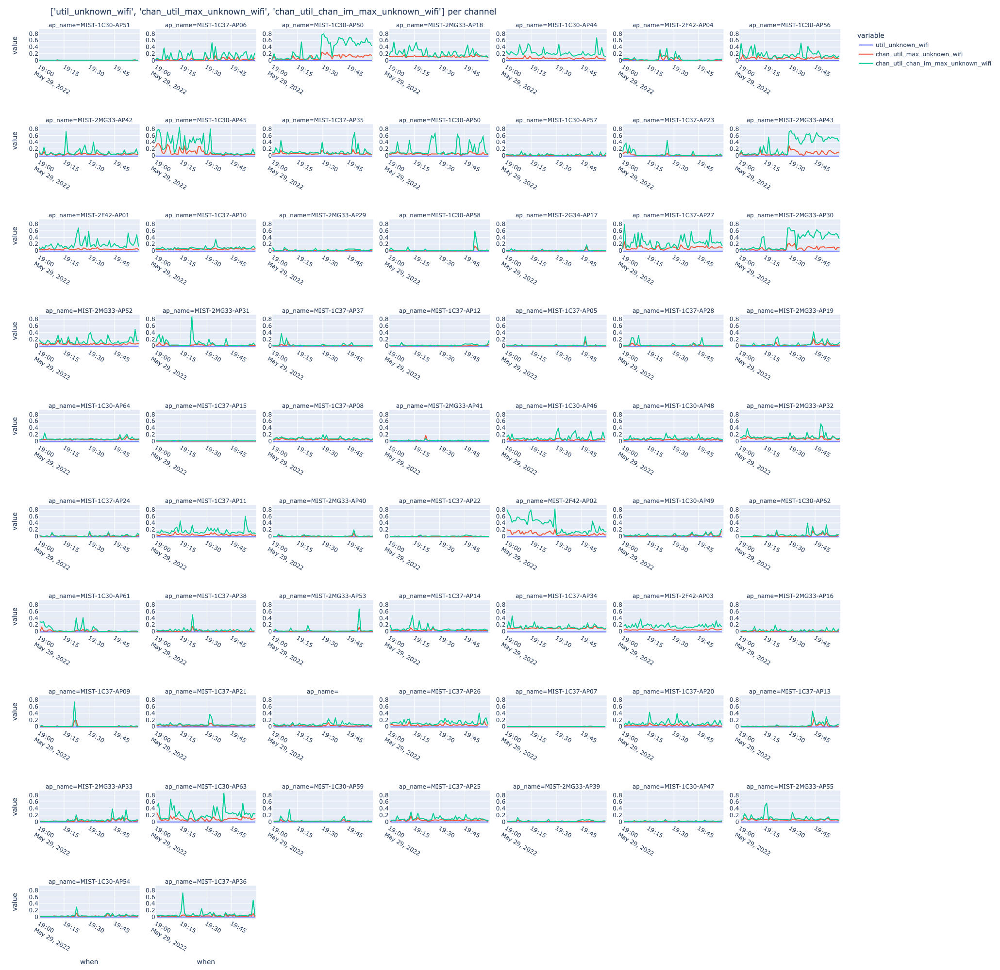

In [118]:
%%local
field = [c for c in df_data_radio.columns if "unknown" in c]
temp = df_data_radio[(df_data_radio["bandwidth"]>0)].sort_values(by="when")
temp["ch"] = temp["channel"].apply(str)
temp["total"] = temp[field].apply(lambda x: sum(x),axis=1)
temp["ap_name"] = temp["ap_id"].apply(lambda x: ap_name.get(x,""))
temp01 = temp[(temp["total"]>0) & (temp["channel"]>20)]
temp01.head()
fig = px.line(temp01,x="when",y=field,hover_data=["channel"],facet_col="ap_name",facet_col_wrap=7)
fig.update_layout(title = "{} per channel".format(field))
fig.update_layout(height=2000, width=2000)
fig.update_yaxes(showticklabels=True)
fig.update_xaxes(showticklabels=True)
fig.show()


In [89]:
%%local

field = [c for c in df_data_radio.columns if "rx_other" in c]
temp = df_data_radio.groupby(["ap_id","channel"])[field].mean().reset_index()
temp["ch"] = temp["channel"].apply(str)
temp["total"] = temp[field].apply(lambda x: sum(x),axis=1)
temp["ap_name"] = temp["ap_id"].apply(lambda x: ap_name.get(x,""))
temp01 = temp[(temp["total"]>0) & (temp["channel"]>20)]
temp01.head()
fig = px.bar(temp01,x="ch",y=field,barmode="group",facet_col="ap_name",facet_col_wrap=4,\
             category_orders={"ch":['0', '1', '3', '6', '11', '36', '40', '44', '48', '52', '56', '116', '120', '124', '128', '132', '140', '144', '149', '153', '157', '161', '165']})
fig.update_layout(title = "{} per channel".format(field))
fig.update_layout(height=800, width=2000)
fig.update_yaxes(showticklabels=True)
fig.update_xaxes(showticklabels=True)
fig.show()


ValueError: Vertical spacing cannot be greater than (1 / (rows - 1)) = 0.062500.
The resulting plot would have 17 rows (rows=17).
Use the facet_row_spacing argument to adjust this spacing.

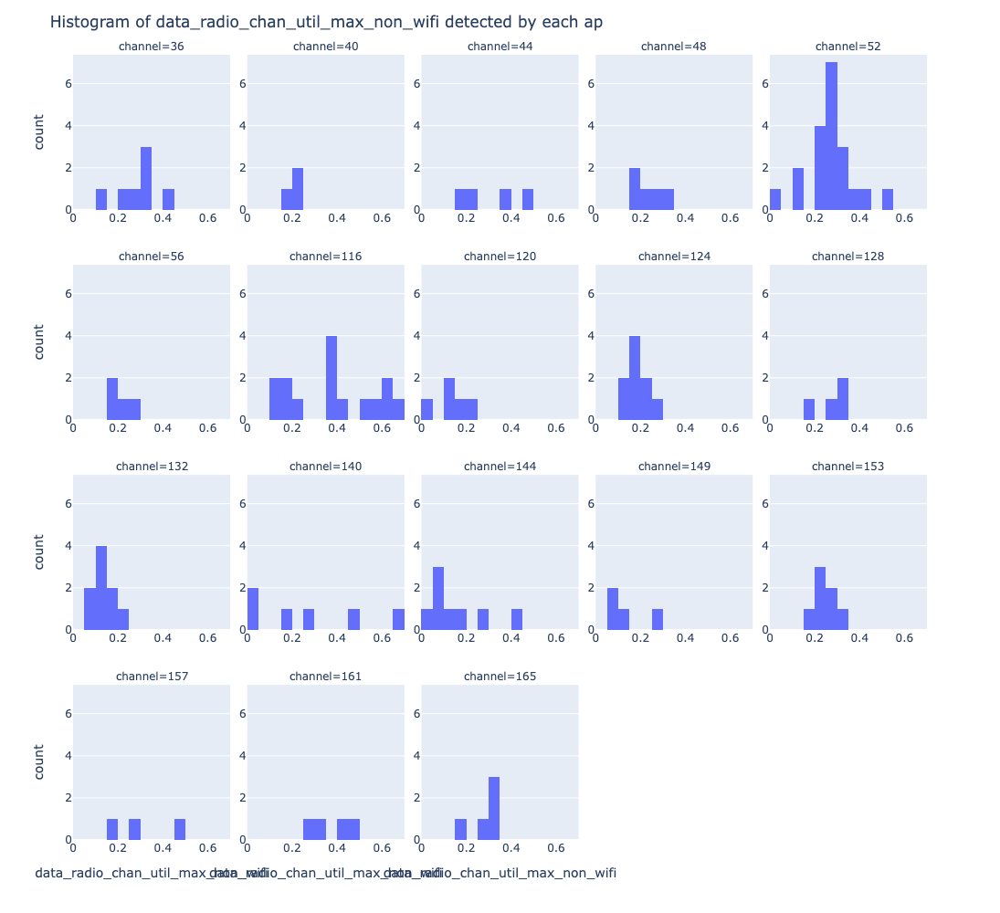

In [28]:
%%local
field = "data_radio_chan_util_max_non_wifi"
temp = df_data_radio[df_data_radio["channel"]>20].groupby(["ap_id","band","channel"])[field].max().reset_index().sort_values(by="channel")
fig = px.histogram(temp,x=field,facet_col="channel",facet_col_wrap=5)
fig.update_layout(title = "Histogram of {} detected by each ap".format(field))
fig.update_layout(height=1000, width=1800)
fig.update_yaxes(showticklabels=True)
fig.update_xaxes(showticklabels=True)
#(temp,x="channel",y="data_radio_noise_floor",color="ap_id",barmode="group")
fig.show()

In [39]:
%%local
data = []
for i in df_data_radio.groupby(["ap_id","band","channel"])["data_radio_noise_floor"].mean().reset_index().iterrows():
    temp = {}
    temp["ap_id"] = i[1]["ap_id"]
    temp["channel"] = i[1]["channel"]
    temp["band"] = i[1]["band"]
    temp["data_radio_noise_floor"] = i[1]["data_radio_noise_floor"]
    for d in devices:
        if temp["ap_id"] == d["mac"]:
            temp["name"] = d["name"]
            temp["x_m"] = d["x_m"]
            temp["y_m"] =d["y_m"]
            temp["x"] = d["x"]
            temp["y"] =d["y"]
    data.append(temp)
    
data

[{'ap_id': 'a8537d00e51a',
  'channel': 52,
  'band': 5,
  'data_radio_noise_floor': -96.61428571428571,
  'name': 'MIST-2MG33-AP19',
  'x_m': 69.08582749803011,
  'y_m': 110.17559818678896,
  'x': 422.0089388333487,
  'y': 673.0047096484726},
 {'ap_id': 'a8537d00e51a',
  'channel': 56,
  'band': 5,
  'data_radio_noise_floor': -96.29629629629629,
  'name': 'MIST-2MG33-AP19',
  'x_m': 69.08582749803011,
  'y_m': 110.17559818678896,
  'x': 422.0089388333487,
  'y': 673.0047096484726},
 {'ap_id': 'a8537d00e51a',
  'channel': 6,
  'band': 24,
  'data_radio_noise_floor': -82.48529411764706,
  'name': 'MIST-2MG33-AP19',
  'x_m': 69.08582749803011,
  'y_m': 110.17559818678896,
  'x': 422.0089388333487,
  'y': 673.0047096484726},
 {'ap_id': 'a8537d00e709',
  'channel': 52,
  'band': 5,
  'data_radio_noise_floor': -97.36363636363636,
  'name': 'MIST-1C37-AP23',
  'x_m': 14.079503499986947,
  'y_m': 96.09625542742985,
  'x': 86.0042724609375,
  'y': 587.0014190673828},
 {'ap_id': 'a8537d00e709',

In [30]:
%%local
i[1]["ap_id"]

'a8537d00e51a'

In [ ]:
### channel to noise floor map 

## Fringe Ap Utilization

In [170]:
aps = ['a8537d00ea01', 'a8537d0134f7', 'a8537d012f52', 'a8537d00e812', 'a8537d013c59', 'a8537d00e9e3', 'a8537d012f20', \
'a8537d00ea9c', 'a8537d01311e', 'a8537d013a74', 'a8537d00eaa1', 'a8537d00eaab', 'a8537d0135ce', 'a8537d013d3a']

df_filter = df_data_radio.filter(F.col("ap_id").isin(aps))
df_filter.count()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

1998

In [171]:
%%spark -o df_filter -n 1998

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

In [176]:
%%local
df_filter.head()

Output()

In [172]:
%%local
df_filter.columns

Index(['ap_id', 'band', 'channel', 'bandwidth', 'data_radio_noise_floor',
       'max_tx_power', 'data_radio_util_rx_other_bss',
       'data_radio_util_non_wifi', 'data_radio_util_unknown_wifi',
       'data_radio_chan_util_max_rx_other_bss',
       'data_radio_chan_util_max_non_wifi',
       'data_radio_chan_util_max_unknown_wifi',
       'data_radio_chan_util_chan_im_rx_other_bss',
       'data_radio_chan_util_chan_im_max_non_wifi',
       'data_radio_chan_util_chan_im_max_unknown_wifi', 'when', 'ap_name',
       'site_id', 'model', 'type'],
      dtype='object')

In [177]:
%%local
sorted(df_filter["channel"].unique())

[0, 1, 3, 6, 11, 36, 44, 48, 56, 120, 124, 128, 140, 149, 157, 161, 165]

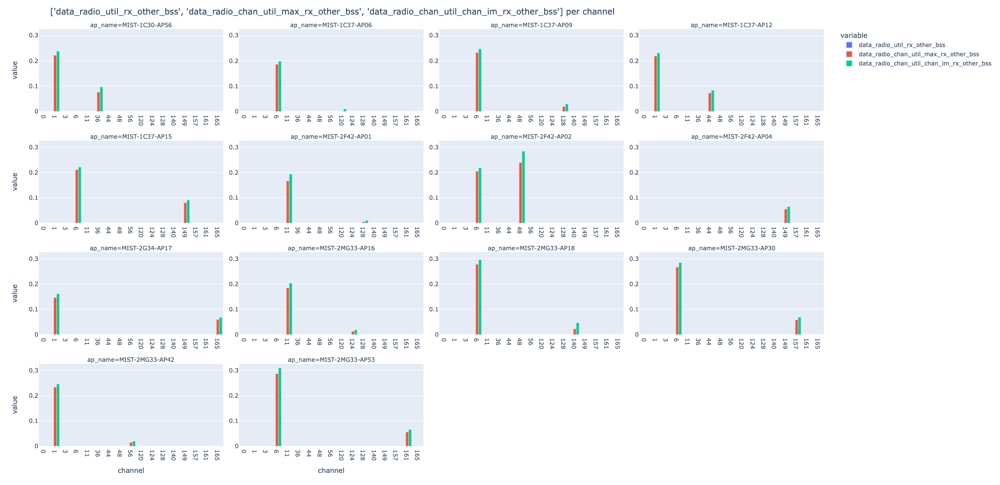

In [178]:
%%local

ap_name = {'a8537d00ea01': 'MIST-1C30-AP56',
 'a8537d0134f7': 'MIST-1C37-AP06',
 'a8537d012f52': 'MIST-2F42-AP02',
 'a8537d00e812': 'MIST-2G34-AP17',
 'a8537d013c59': 'MIST-1C37-AP09',
 'a8537d00e9e3': 'MIST-1C37-AP15',
 'a8537d012f20': 'MIST-2F42-AP01',
 'a8537d00ea9c': 'MIST-2MG33-AP16',
 'a8537d01311e': 'MIST-1C37-AP12',
 'a8537d013a74': 'MIST-2MG33-AP53',
 'a8537d00eaa1': 'MIST-2MG33-AP18',
 'a8537d00eaab': 'MIST-2MG33-AP30',
 'a8537d0135ce': 'MIST-2F42-AP04',
 'a8537d013d3a': 'MIST-2MG33-AP42'}

df_filter["ap_name"] = df_filter["ap_id"].apply(lambda x: ap_name.get(x))


#['data_radio_noise_floor','data_radio_util_rx_other_bss','data_radio_util_non_wifi', 'data_radio_chan_util_max_rx_other_bss',\
#          'data_radio_chan_util_max_non_wifi','data_radio_chan_util_rx_other_bss','data_radio_chan_util_chan_im_max_non_wifi']
field = ['data_radio_util_rx_other_bss','data_radio_chan_util_max_rx_other_bss',\
          'data_radio_chan_util_chan_im_rx_other_bss']
temp = df_filter.groupby(["ap_name","channel"])[field].mean().reset_index()
temp["channel"] = temp["channel"].apply(str)
    
fig = px.bar(temp,x="channel",y=field,barmode="group",facet_col="ap_name",facet_col_wrap=4,category_orders={"channel":["0","1", "3", "6", "11", "36", "44", "48", "56", "120", "124", "128", "140", "149", "157", "161", "165"]})
fig.update_layout(title = "{} per channel".format(field))
fig.update_layout(height=1000, width=2000)
fig.update_yaxes(showticklabels=True)
fig.update_xaxes(showticklabels=True)
fig.show()



In [180]:
%%local
col = df_filter.columns
col

Index(['ap_id', 'band', 'channel', 'bandwidth', 'data_radio_noise_floor',
       'max_tx_power', 'data_radio_util_rx_other_bss',
       'data_radio_util_non_wifi', 'data_radio_util_unknown_wifi',
       'data_radio_chan_util_max_rx_other_bss',
       'data_radio_chan_util_max_non_wifi',
       'data_radio_chan_util_max_unknown_wifi',
       'data_radio_chan_util_chan_im_rx_other_bss',
       'data_radio_chan_util_chan_im_max_non_wifi',
       'data_radio_chan_util_chan_im_max_unknown_wifi', 'when', 'ap_name',
       'site_id', 'model', 'type'],
      dtype='object')

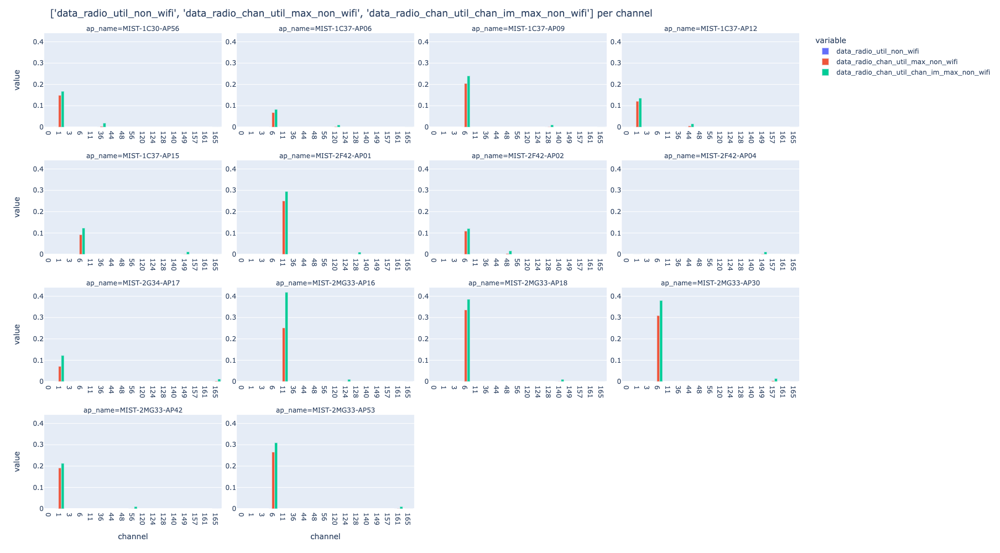

In [183]:
%%local

field = [c for c in col if "non_wifi" in c]
temp = df_filter.groupby(["ap_name","channel"])[field].mean().reset_index()
temp["channel"] = temp["channel"].apply(str)
    
fig = px.bar(temp,x="channel",y=field,barmode="group",facet_col="ap_name",facet_col_wrap=4,category_orders={"channel":["0","1", "3", "6", "11", "36", "44", "48", "56", "120", "124", "128", "140", "149", "157", "161", "165"]})
fig.update_layout(title = "{} per channel".format(field))
fig.update_layout(height=1000, width=2000)
fig.update_yaxes(showticklabels=True)
fig.update_xaxes(showticklabels=True)
fig.show()
